# AirBnb Pricing Prediction

# Data Manipulation 

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from decimal import Decimal
import re
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import LinearRegression
from  sklearn.preprocessing  import PolynomialFeatures
from sklearn import svm
from sklearn.model_selection import GridSearchCV,cross_val_score
from sklearn.metrics import r2_score
import warnings
warnings.filterwarnings("ignore")

In [3]:
import seaborn as sns
sns.set()

In [4]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

## listings.csv

In [5]:
listings = pd.read_csv('listings.csv.gz')

In [6]:
listings.head(5)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,958,https://www.airbnb.com/rooms/958,20190806030527,2019-08-06,"Bright, Modern Garden Unit - 1BR/1B",New update: the house next door is under const...,"Newly remodeled, modern, and bright garden uni...",New update: the house next door is under const...,none,*Quiet cul de sac in friendly neighborhood *St...,Due to the fact that we have children and a do...,*Public Transportation is 1/2 block away. *Ce...,*Full access to patio and backyard (shared wit...,A family of 4 lives upstairs with their dog. N...,* No Pets - even visiting guests for a short t...,NaN,NaN,https://a0.muscache.com/im/pictures/b7c2a199-4...,NaN,1169,https://www.airbnb.com/users/show/1169,Holly,2008-07-31,"San Francisco, California, United States",We are a family with 2 boys born in 2009 and 2...,within an hour,90%,NaN,t,https://a0.muscache.com/im/pictures/efdad96a-3...,https://a0.muscache.com/im/pictures/efdad96a-3...,Duboce Triangle,1.0,1.0,"['email', 'phone', 'facebook', 'reviews', 'kba']",t,t,"San Francisco, CA, United States",Lower Haight,Western Addition,NaN,San Francisco,CA,94117,San Francisco,"San Francisco, CA",US,United States,37.76931,-122.43386,t,Apartment,Entire home/apt,3,1.0,1.0,2.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,Kitchen,""Pets liv...",NaN,$170.00,"$1,120.00","$4,200.00",$100.00,$100.00,2,$25.00,1,30,1,1,30,30,1.0,30.0,today,t,1,2,7,115,2019-08-06,199,46,2009-07-23,2019-07-19,97.0,10.0,10.0,10.0,10.0,10.0,9.0,t,STR-0001256,"{""SAN FRANCISCO""}",t,f,moderate,f,f,1,1,0,0,1.63
1,3850,https://www.airbnb.com/rooms/3850,20190806030527,2019-08-06,Charming room for two,Your own private room plus access to a shared ...,"This is the first room I rented on Airbnb, sta...",Your own private room plus access to a shared ...,none,"This is a quiet, safe neighborhood on a substa...",Here is the complete list of House Rules you a...,Public transit service to my house is outstand...,"During the hours of 7:00 to 22:00, your access...","I live at the house in my own bedroom, and I w...",These House Rules have money associated with t...,NaN,NaN,https://a0.muscache.com/im/pictures/b6e97d2a-1...,NaN,4921,https://www.airbnb.com/users/show/4921,Kevin,2008-12-08,"San Francisco, California, United States",I am a retired software entrepreneur now raisi...,with

In [7]:
listings.duplicated().sum()

0

In [8]:
listings.shape

(7833, 106)

In [9]:
listings.dtypes

id                                                int64
listing_url                                      object
scrape_id                                         int64
last_scraped                                     object
name                                             object
summary                                          object
space                                            object
description                                      object
experiences_offered                              object
neighborhood_overview                            object
notes                                            object
transit                                          object
access                                           object
interaction                                      object
house_rules                                      object
thumbnail_url                                   float64
medium_url                                      float64
picture_url                                     

In [10]:
# delete some information: descriptions, empty ones, same value
listings.drop(['listing_url', 'scrape_id', 'last_scraped', 'name', 'summary', 'space', 'description', 
              'experiences_offered', 'neighborhood_overview', 'notes', 'transit', 'access', 'interaction',
              'house_rules', 'thumbnail_url', 'medium_url', 'picture_url', 'xl_picture_url', 'host_url',
              'host_since', 
              'host_location', 'host_about', 'host_acceptance_rate', 'host_thumbnail_url',
              'host_picture_url', 'host_listings_count', 'host_total_listings_count', 
              'host_verifications', 'host_has_profile_pic', 'street', 'neighbourhood_group_cleansed',
              'city', 'state', 'zipcode', 'market', 'smart_location', 'country_code', 'country',
              'bed_type', 'amenities', 'square_feet', 'calendar_updated', 'has_availability', 'availability_30',
              'availability_60', 'availability_90', 'availability_365', 'calendar_last_scraped', 'requires_license',
              'license', 'jurisdiction_names', 'instant_bookable', 'is_business_travel_ready', 
              'require_guest_profile_picture', 'require_guest_phone_verification',], axis=1, inplace=True)

In [11]:
# id: the listing_id used in the reviews.csv
# host_name: not necessary if host_id is used
# weekly_price, monthly_price: too much missing data
# redundant information: minimum_minimum_nights, maximum_minimum_nights, minimum_maximum_nights, maximum_maximum_nights,                             0
#                        
# first_review, last_review: dates, not useful
# calculated_host_*: statistics of listings for each host, 
listings.drop(['host_name', 'weekly_price', 'monthly_price', 
              'minimum_minimum_nights', 'maximum_minimum_nights',
              'minimum_maximum_nights', 'maximum_maximum_nights', 
              'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm',
              'number_of_reviews_ltm', 
              'first_review', 'last_review', #'calculated_host_listings_count',
              #'calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms',
              #'calculated_host_listings_count_shared_rooms',
              ], axis=1, inplace=True)

In [12]:
listings['host_neighbourhood'] == listings['neighbourhood']

0       False
1        True
2        True
3        True
4        True
5       False
6        True
7        True
8        True
9        True
10       True
11       True
12      False
13      False
14      False
15      False
16       True
17       True
18      False
19      False
20       True
21      False
22       True
23       True
24       True
25       True
26       True
27       True
28      False
29       True
30      False
31      False
32       True
33       True
34       True
35       True
36       True
37       True
38       True
39       True
40       True
41       True
42       True
43       True
44       True
45       True
46       True
47       True
48       True
49      False
50      False
51       True
52      False
53      False
54       True
55       True
56       True
57       True
58       True
59       True
60       True
61      False
62      False
63       True
64       True
65       True
66       True
67       True
68       True
69       True
70      False
71    

In [13]:
listings.iloc[11] # the one with False from above commend
                  # based on lat and long, Hayes Valley is the correct place not Lower Haight,
                  # and there is overlap between "Hayes Valley" and "Lower Haight"
                  # "Western Addition" is quite larger, contains several microhoods
                  # combined with other datat "neightborhood",
                  # "neighbourhood_cleansed" is suggested 

id                                                                    10820
host_id                                                               38836
host_response_time                                       within a few hours
host_response_rate                                                     100%
host_is_superhost                                                         f
host_neighbourhood                                             Lower Haight
host_identity_verified                                                    t
neighbourhood                                                  Lower Haight
neighbourhood_cleansed                                       Haight Ashbury
latitude                                                            37.7719
longitude                                                          -122.439
is_location_exact                                                         t
property_type                                                     Apartment
room_type   

In [14]:
listings.drop(['host_neighbourhood', 'neighbourhood'], axis=1, inplace=True)

In [15]:
listings.drop(['id', 'host_id', 'latitude', 'longitude'], axis=1, inplace=True)

In [16]:
listings.shape

(7833, 33)

In [17]:
# Superhosts are experienced hosts who provide a shining example for other hosts,
# and extraordinary experiences for their guests.

In [18]:
# review_scores_rating is calculated from other six ratings.
# Overall Experience. What was your guest’s overall experience?
# Cleanliness. Did your guests feel that your space was clean and tidy?
# Accuracy. How accurately did your listing page represent your space?
# Value. Did your guest feel your listing provided good value for the price?
# Communication. How well did you communicate with your guest before and during their stay?
# Arrival. How smoothly did their check-in go?
# Location. How did guests feel about your neighborhood?

In [19]:
listings.isnull().sum()

host_response_time                               791
host_response_rate                               791
host_is_superhost                                  1
host_identity_verified                             1
neighbourhood_cleansed                             0
is_location_exact                                  0
property_type                                      0
room_type                                          0
accommodates                                       0
bathrooms                                         18
bedrooms                                           3
beds                                              11
price                                              0
security_deposit                                1597
cleaning_fee                                     848
guests_included                                    0
extra_people                                       0
minimum_nights                                     0
maximum_nights                                

In [20]:
listings.fillna({'review_scores_rating':listings['review_scores_rating'].mean()}, inplace=True) 
listings.fillna({'review_scores_accuracy':listings['review_scores_accuracy'].mean()}, inplace=True) 
listings.fillna({'review_scores_cleanliness':listings['review_scores_cleanliness'].mean()}, inplace=True) 
listings.fillna({'review_scores_checkin':listings['review_scores_checkin'].mean()}, inplace=True) 
listings.fillna({'review_scores_communication':listings['review_scores_communication'].mean()}, inplace=True) 
listings.fillna({'review_scores_location':listings['review_scores_location'].mean()}, inplace=True) 
listings.fillna({'review_scores_value':listings['review_scores_value'].mean()}, inplace=True) 

In [21]:
listings[listings['number_of_reviews']==0]['reviews_per_month']

137    NaN
258    NaN
410    NaN
497    NaN
601    NaN
646    NaN
755    NaN
792    NaN
809    NaN
810    NaN
894    NaN
941    NaN
1038   NaN
1060   NaN
1087   NaN
1102   NaN
1140   NaN
1190   NaN
1286   NaN
1317   NaN
1367   NaN
1408   NaN
1431   NaN
1442   NaN
1455   NaN
1467   NaN
1484   NaN
1503   NaN
1521   NaN
1535   NaN
1562   NaN
1602   NaN
1622   NaN
1678   NaN
1688   NaN
1715   NaN
1719   NaN
1749   NaN
1873   NaN
1946   NaN
1958   NaN
1962   NaN
1991   NaN
2012   NaN
2032   NaN
2049   NaN
2051   NaN
2073   NaN
2074   NaN
2075   NaN
2079   NaN
2080   NaN
2081   NaN
2092   NaN
2111   NaN
2136   NaN
2181   NaN
2193   NaN
2355   NaN
2373   NaN
2383   NaN
2401   NaN
2402   NaN
2403   NaN
2421   NaN
2422   NaN
2440   NaN
2453   NaN
2463   NaN
2468   NaN
2477   NaN
2535   NaN
2566   NaN
2575   NaN
2586   NaN
2592   NaN
2593   NaN
2648   NaN
2655   NaN
2671   NaN
2731   NaN
2739   NaN
2747   NaN
2758   NaN
2778   NaN
2784   NaN
2794   NaN
2822   NaN
2853   NaN
2885   NaN
2899   NaN

In [22]:
listings.fillna({'reviews_per_month':0}, inplace=True) 

In [24]:
# to remove the "$" charactor, we need to change the data type, should not run the second time
listings['price'] = [float(Decimal(re.sub(r'[^\d.]', '', x))) if type(x) == str else x for x in listings['price']]
listings['extra_people'] = [float(Decimal(re.sub(r'[^\d.]', '', x))) if type(x) == str else x for x in listings['extra_people']]
listings['security_deposit'] = [float(Decimal(re.sub(r'[^\d.]', '', x))) if type(x) == str else x for x in listings['security_deposit']]
listings['cleaning_fee'] = [float(Decimal(re.sub(r'[^\d.]', '', x))) if type(x) == str else x for x in listings['cleaning_fee']]

In [25]:
# default should be zero
listings.fillna({'security_deposit':0}, inplace=True) 
listings.fillna({'cleaning_fee':0}, inplace=True) 

In [26]:
listings['host_response_rate'] = [float(x.strip('%')) if type(x) == str else x for x in listings['host_response_rate']]

In [27]:
listings = listings.dropna(how='any')

In [28]:
listings.shape

(7012, 33)

In [29]:
listings.isnull().sum()

host_response_time                              0
host_response_rate                              0
host_is_superhost                               0
host_identity_verified                          0
neighbourhood_cleansed                          0
is_location_exact                               0
property_type                                   0
room_type                                       0
accommodates                                    0
bathrooms                                       0
bedrooms                                        0
beds                                            0
price                                           0
security_deposit                                0
cleaning_fee                                    0
guests_included                                 0
extra_people                                    0
minimum_nights                                  0
maximum_nights                                  0
number_of_reviews                               0


In [30]:
################# drop some row with strange values ###########################

In [31]:
print(listings.describe().loc[['min','max']])

     host_response_rate  accommodates  bathrooms  bedrooms  beds   price  security_deposit  cleaning_fee  guests_included  extra_people  minimum_nights  maximum_nights  number_of_reviews  review_scores_rating  review_scores_accuracy  review_scores_cleanliness  review_scores_checkin  review_scores_communication  review_scores_location  review_scores_value  calculated_host_listings_count  calculated_host_listings_count_entire_homes  calculated_host_listings_count_private_rooms  calculated_host_listings_count_shared_rooms  reviews_per_month
min                 0.0           1.0        0.0       0.0   0.0     0.0               0.0           0.0              1.0           0.0             1.0             1.0                0.0                  20.0                     2.0                        2.0                    2.0                          2.0                     2.0                  2.0                             1.0                                          0.0                       

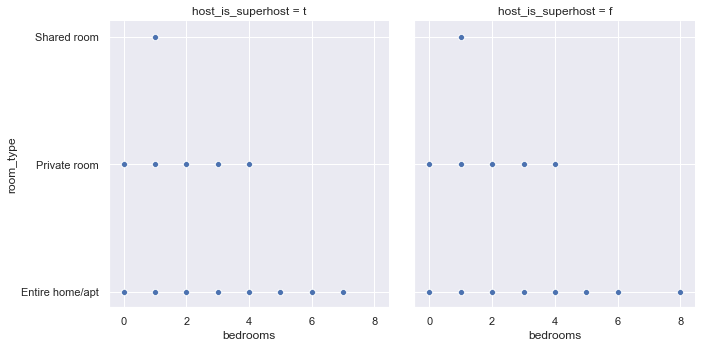

In [32]:
sns.relplot(x="bedrooms", y="room_type", col="host_is_superhost",
            data=listings);

In [33]:
listings_0_bedroom = listings[listings['bedrooms']==0]

In [34]:
listings_0_bedroom.shape

(754, 33)

In [35]:
listings_14_bedroom = listings[listings['bedrooms']==14]

In [36]:
listings_14_bedroom.shape

(0, 33)

In [37]:
listings = listings[listings['bedrooms']>0]
listings = listings[listings['bedrooms']<14]

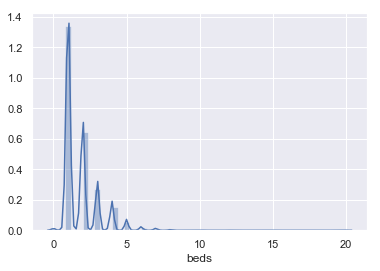

In [38]:
sns.distplot(listings['beds'])

In [39]:
listings_0_bed = listings[listings['beds']==0]

In [40]:
listings_0_bed.shape

(26, 33)

In [41]:
listings = listings[listings['beds']>0]

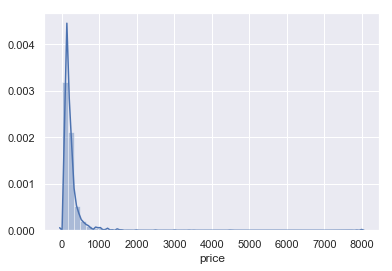

In [42]:
sns.distplot(listings['price'])

In [43]:
print(min(listings['price']), max(listings['price']))

0.0 8000.0


In [44]:
sum(listings['price']>500)

357

In [45]:
listings = listings[listings['price']>0]
listings = listings[listings['price']<500]

In [46]:
# minimum_nights, maximum_nights: some big values exist, they are strange but should not be directly dropped

In [47]:
# final:
listings.shape

(5829, 33)

In [48]:
############################### some simple visulization ###########################################

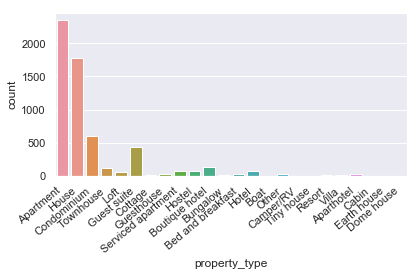

In [49]:
ax = sns.countplot(x="property_type", data=listings)

ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

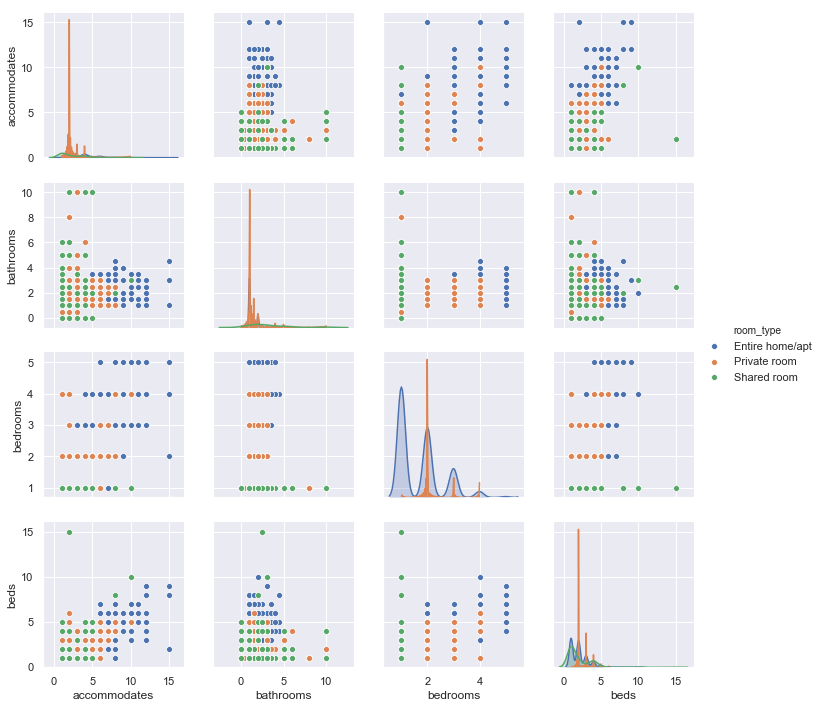

In [50]:
# attributes about the room 
listings_room = listings[['room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds']]
sns.pairplot(data=listings_room, hue="room_type")

In [51]:
# attributes about the reviews
lisitngs_review = listings[['review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 
                           'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 
                           'review_scores_value']]

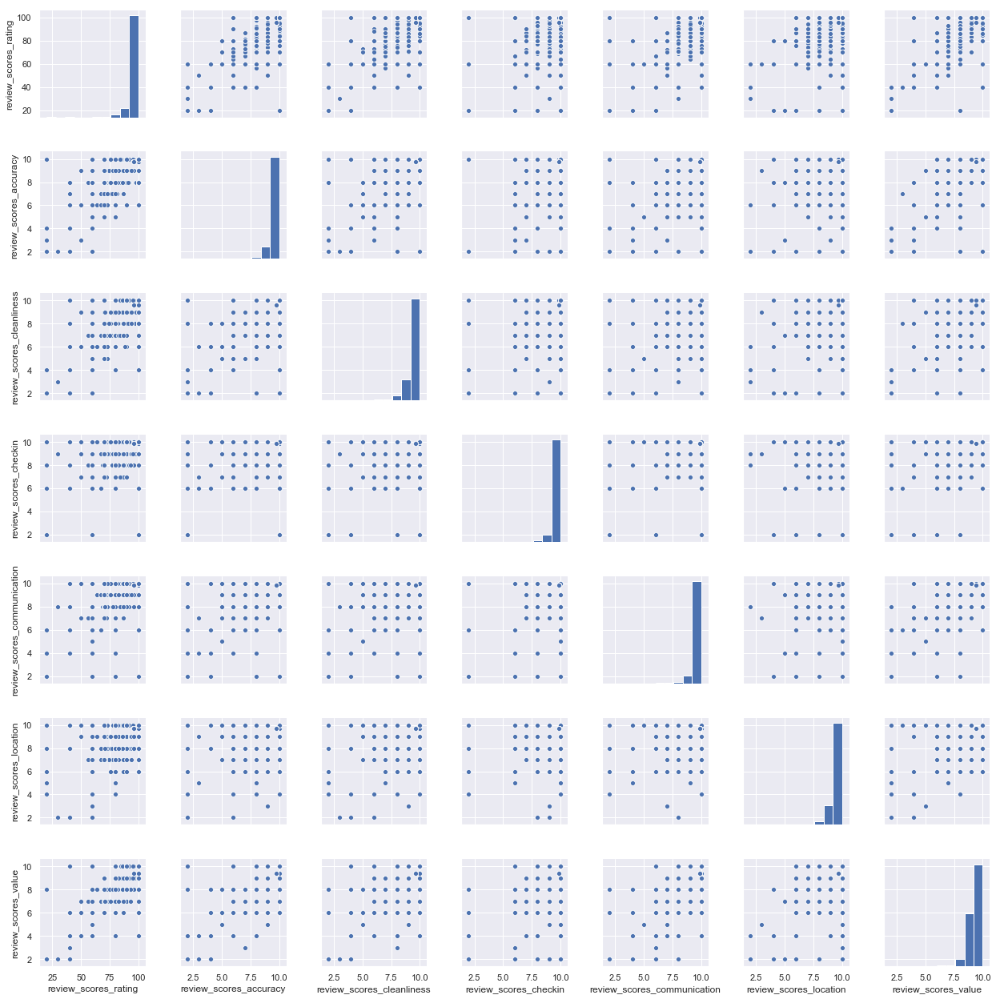

In [52]:
sns.pairplot(data=lisitngs_review) 
# note: all review scores are skewed 

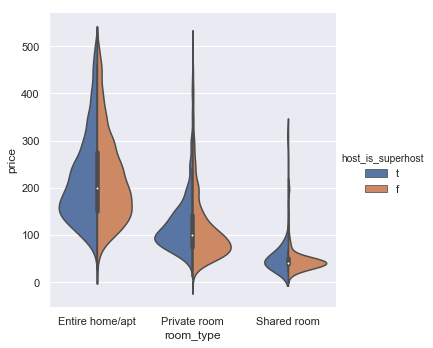

In [53]:
sns.catplot(x="room_type", y="price", hue="host_is_superhost",
            kind="violin", split=True, data=listings)

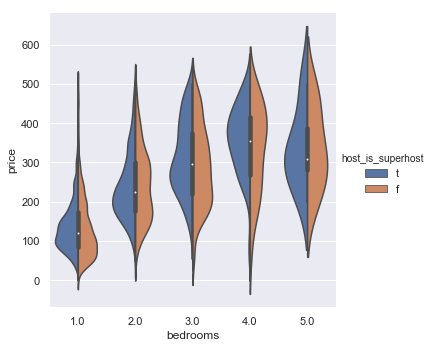

In [54]:
sns.catplot(x="bedrooms", y="price", hue="host_is_superhost",
            kind="violin", split=True, data=listings)

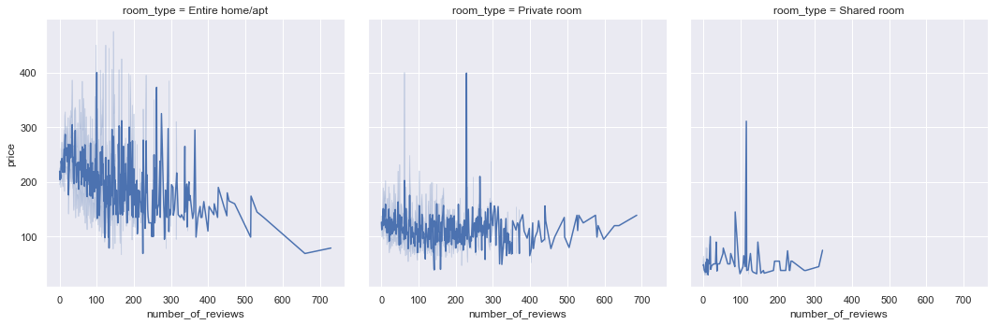

In [55]:
sns.relplot(x="number_of_reviews", y="price", col="room_type",
            kind="line", data=listings);

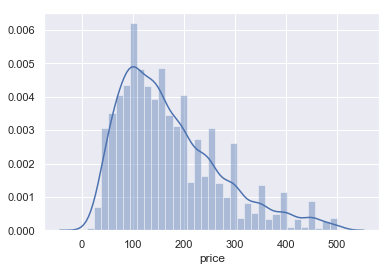

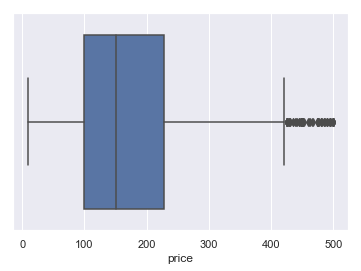

0.9959401003670516

In [56]:
sns.distplot(listings["price"])
plt.show()
sns.boxplot("price",data = listings)
plt.show()
listings["price"].skew()

Index(['host_response_time', 'host_response_rate', 'host_is_superhost', 'host_identity_verified', 'neighbourhood_cleansed', 'is_location_exact', 'property_type', 'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'price', 'security_deposit', 'cleaning_fee', 'guests_included', 'extra_people', 'minimum_nights', 'maximum_nights', 'number_of_reviews', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value', 'cancellation_policy', 'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms', 'calculated_host_listings_count_shared_rooms', 'reviews_per_month'], dtype='object')

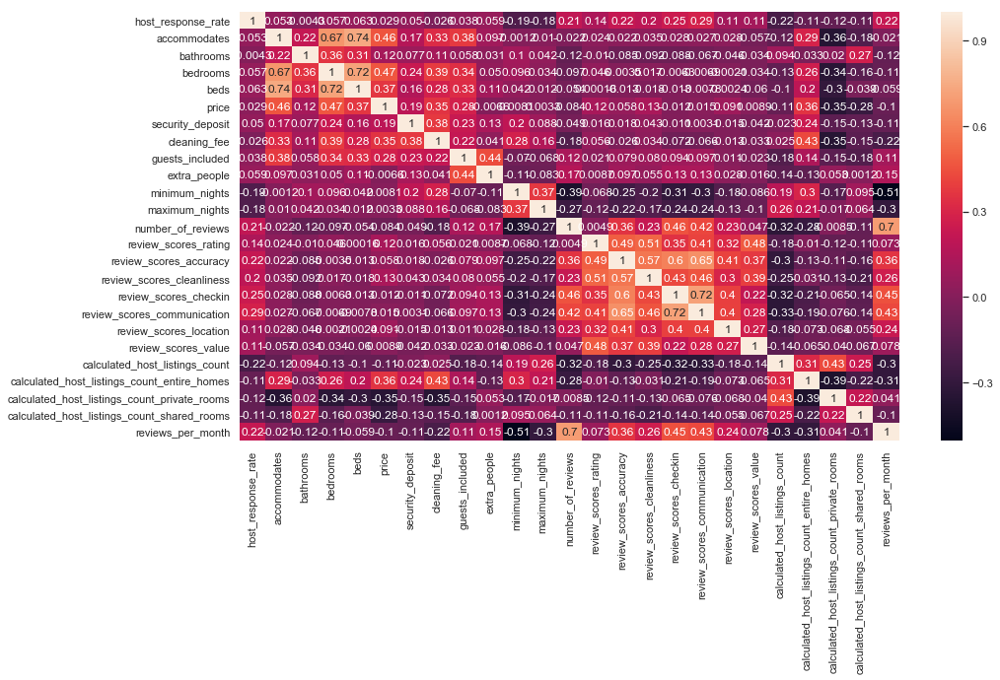

In [57]:

corr = listings.corr(method='kendall')
plt.figure(figsize=(15,8))
sns.heatmap(corr, annot=True)
listings.columns

In [58]:
listings['host_response_time'].unique()

array(['within an hour', 'within a day', 'within a few hours',
       'a few days or more'], dtype=object)

In [59]:
response_time = pd.get_dummies(listings["host_response_time"],columns = "host_response_time", prefix = "host_response_time")
response_time

,host_response_time_a few days or more,host_response_time_within a day,host_response_time_within a few hours,host_response_time_within an hour
0,0,0,0,1
1,0,0,0,1
2,0,1,0,0
3,0,0,0,1
4,0,0,0,1
5,0,0,1,0
6,0,1,0,0
7,0,0,0,1
8,0,0,0,1
9,0,0,0,1


In [60]:
listings = pd.concat([listings, response_time], axis=1)
listings.drop(['host_response_time'],axis=1,inplace= True)
listings

,host_response_rate,host_is_superhost,host_identity_verified,neighbourhood_cleansed,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,cancellation_policy,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,host_response_time_a few days or more,host_response_time_within a day,host_response_time_within a few hours,host_response_time_within an hour
0,90.0,t,t,Western Addition,t,Apartment,Entire home/apt,3,1.0,1.0,2.0,170.0,100.0,100.0,2,25.0,1,30,199,97.000000,10.000000,10.0000,10.000000,10.000000,10.000000,9.000000,moderate,1,1,0,0,1.63,0,0,0,1
1,100.0,t,t,Inner Sunset,t,House,Private room,2,1.0,1.0,1.0,99.0,0.0,10.0,2,20.0,1,5,136,94.000000,9.000000,9.0000,10.000000,10.000000,9.000000,9.000000,strict_14_with_grace_period,3,0,3,0,1.11,0,0,0,1
2,67.0,f,t,Bernal Heights,t,Apartment,Entire home/apt,5,1.0,2.0,3.0,235.0,0.0,100.0,2,0.0,30,60,111,98.000000,10.000000,10.0000,10.000000,10.000000,10.000000,9.000000,strict_14_with_grace_period,1,1,0,0,0.89,0,1,0,0
3,100.0,t,t,Haight Ashbury,t,Apartment,Private room,2,4.0,1.0,1.0,65.0,200.0,50.0,1,12.0,32,60,17,85.000000,8.000000,8.0000,9.000000,9.000000,9.000000,8.000000,strict_14_with_grace_period,9,0,9,0,0.14,0,0,0,1
4,100.0,t,t,Haight Ashbury,t,Apartment,Private room,2,4.0,1.0,1.0,65.0,200.0,50.0,1,12.0,32,90,8,93.000000,9.000000,9.0000,10.000000,10.000000,9.000000,9.000000,strict_14_with_grace_period,9,0,9,0,0.13,0,0,0,1
5,100.0,f,t,Western Addition,t,House,Entire home/apt,4,1.5,2.0,2.0,475.0,0.0,225.0,2,150.0,4,1125,28,97.000000,10.000000,10.0000,10.000000,10.000000,10.000000,10.000000,moderate,2,2,0,0,0.23,0,0,1,0
6,100.0,f,f,Western Addition,t,Apartment,Entire home/apt,6,1.0,2.0,3.0,255.0,0.0,125.0,1,0.0,2,365,36,91.000000,10.000000,8.0000,10.000000,10.000000,10.000000,9.000000,moderate,1,1,0,0,0.30,0,1,0,0
7,100.0,t,f,Mission,t,Condominium,Private room,3,1.0,1.0,2.0,139.0,0.0,50.0,2,60.0,1,14,687,98.000000,10.000000,10.0000,10.000000,10.000000,10.000000,10.000000,strict_14_with_grace_period,2,0,2,0,5.63,0,0,0,1
8,100.0,t,t,Potrero Hill,t,House,Private room,2,1.0,1.0,1.0,135.0,0.0,50.0,1,0.0,1,365,492,94.000000,10.000000,10.0000,10.000000,10.000000,10.000000,9.000000,strict_14_with_grace_period,1,0,1,0,4.13,0,0,0,1
9,100.0,t,t,Mission,t,House,Entire home/apt,6,1.0,2.0,3.0,265.0,500.0,100.0,4,45.0,30,60,337,96.000000,10.000000,10.0000,10.000000,10.000000,10.000000,9.000000,moderate,1,1,0,0,2.80,0,0,0,1


In [61]:
listings["host_is_superhost"].unique()

array(['t', 'f'], dtype=object)

In [62]:
listings.describe()

,host_response_rate,accommodates,bathrooms,bedrooms,beds,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,host_response_time_a few days or more,host_response_time_within a day,host_response_time_within a few hours,host_response_time_within an hour
count,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000,5829.000000
mean,96.415337,3.049065,1.392520,1.404186,1.716589,172.285126,355.790702,95.297307,1.708012,17.317722,15.573512,534.487734,51.167096,95.584447,9.762229,9.613503,9.858173,9.833519,9.692983,9.400051,22.260937,18.505404,2.995368,0.760165,1.686802,0.010122,0.113399,0.200892,0.675588
std,11.363627,1.743503,0.940483,0.716955,1.071228,98.668038,652.495125,84.261654,1.230129,29.079051,20.150522,585.417253,81.964469,6.352995,0.645156,0.743256,0.484629,0.555494,0.598023,0.754626,55.685452,54.446679,6.002043,3.518524,2.058539,0.100105,0.317107,0.400702,0.468195
min,0.000000,1.000000,0.000000,1.000000,1.000000,10.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,20.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,100.000000,2.000000,1.000000,1.000000,1.000000,99.000000,0.000000,35.000000,1.000000,0.000000,2.000000,29.000000,1.000000,95.000000,9.767117,9.625100,9.859325,9.835958,9.686174,9.000000,1.000000,0.000000,0.000000,0.000000,0.120000,0.000000,0.000000,0.000000,0.000000
50%,100.000000,2.000000,1.000000,1.000000,1.000000,150.000000,150.000000,80.000000,1.000000,5.000000,4.000000,180.000000,15.000000,96.000000,10.000000,10.000000,10.000000,10.000000,10.000000,9.403859,2.000000,1.000000,1.000000,0.000000,0.840000,0.000000,0.000000,0.000000,1.000000
75%,100.000000,4.000000,1.500000,2.000000,2.000000,228.000000,500.000000,125.000000,2.000000,25.000000,30.000000,1125.000000,68.000000,99.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,7.000000,2.000000,3.000000,0.000000,2.660000,0.000000,0.000000,0.000000,1.000000
max,100.000000,15.000000,10.000000,5.000000,15.000000,499.000000,5100.000000,663.000000,10.000000,300.000000,365.000000,10000.000000,730.000000,100.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,254.000000,254.000000,43.000000,25.000000,14.060000,1.000000,1.000000,1.000000,1.000000


In [63]:
listings["host_is_superhost"] = listings["host_is_superhost"].map({'f' : 0, 't' : 1}).astype(int)

In [64]:
listings["neighbourhood_cleansed"].nunique()

36

In [65]:
series = pd.value_counts(listings.neighbourhood_cleansed)
mask = (series/series.sum() * 100).lt(1)
listings['neighbourhood_cleansed'] = np.where(listings['neighbourhood_cleansed'].isin(series[mask].index),'Other',listings['neighbourhood_cleansed'])
print(listings['neighbourhood_cleansed'].nunique())
pvt = listings.pivot_table(index= "neighbourhood_cleansed", values="calculated_host_listings_count", aggfunc='count')
pvt = pvt.sort_values("calculated_host_listings_count",ascending=False)
pvt


28


,calculated_host_listings_count
neighbourhood_cleansed,
Mission,569
South of Market,484
Western Addition,467
Castro/Upper Market,322
Downtown/Civic Center,313
Haight Ashbury,304
Bernal Heights,300
Noe Valley,256
Nob Hill,253


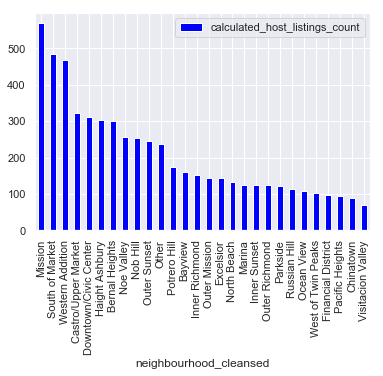

In [66]:
pvt.plot(kind='bar', color='blue')

In [67]:
neighborhood = pd.get_dummies(listings["neighbourhood_cleansed"],columns = "neighbourhood_cleansed", prefix = "neighbourhood")
listings = pd.concat([listings, neighborhood], axis=1)
listings.drop(["neighbourhood_cleansed"],axis=1,inplace= True)
listings

,host_response_rate,host_is_superhost,host_identity_verified,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,cancellation_policy,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,host_response_time_a few days or more,host_response_time_within a day,host_response_time_within a few hours,host_response_time_within an hour,neighbourhood_Bayview,neighbourhood_Bernal Heights,neighbourhood_Castro/Upper Market,neighbourhood_Chinatown,neighbourhood_Downtown/Civic Center,neighbourhood_Excelsior,neighbourhood_Financial District,neighbourhood_Haight Ashbury,neighbourhood_Inner Richmond,neighbourhood_Inner Sunset,neighbourhood_Marina,neighbourhood_Mission,neighbourhood_Nob Hill,neighbourhood_Noe Valley,neighbourhood_North Beach,neighbourhood_Ocean View,neighbourhood_Other,neighbourhood_Outer Mission,neighbourhood_Outer Richmond,neighbourhood_Outer Sunset,neighbourhood_Pacific Heights,neighbourhood_Parkside,neighbourhood_Potrero Hill,neighbourhood_Russian Hill,neighbourhood_South of Market,neighbourhood_Visitacion Valley,neighbourhood_West of Twin Peaks,neighbourhood_Western Addition
0,90.0,1,t,t,Apartment,Entire home/apt,3,1.0,1.0,2.0,170.0,100.0,100.0,2,25.0,1,30,199,97.000000,10.000000,10.0000,10.000000,10.000000,10.000000,9.000000,moderate,1,1,0,0,1.63,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,100.0,1,t,t,House,Private room,2,1.0,1.0,1.0,99.0,0.0,10.0,2,20.0,1,5,136,94.000000,9.000000,9.0000,10.000000,10.000000,9.000000,9.000000,strict_14_with_grace_period,3,0,3,0,1.11,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,67.0,0,t,t,Apartment,Entire home/apt,5,1.0,2.0,3.0,235.0,0.0,100.0,2,0.0,30,60,111,98.000000,10.000000,10.0000,10.000000,10.000000,10.000000,9.000000,strict_14_with_grace_period,1,1,0,0,0.89,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,100.0,1,t,t,Apartment,Private room,2,4.0,1.0,1.0,65.0,200.0,50.0,1,12.0,32,60,17,85.000000,8.000000,8.0000,9.000000,9.000000,9.000000,8.000000,strict_14_with_grace_period,9,0,9,0,0.14,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,100.0,1,t,t,Apartment,Private room,2,4.0,1.0,1.0,65.0,200.0,50.0,1,12.0,32,90,8,93.000000,9.000000,9.0000,10.000000,10.000000,9.000000,9.000000,strict_14_with_grace_period,9,0,9,0,0.13,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,100.0,0,t,t,House,Entire home/apt,4,1.5,2.0,2.0,475.0,0.0,225.0,2,150.0,4,1125,28,97.000000,10.000000,10.0000,10.000000,10.000000,10.000000,10.000000,moderate,2,2,0,0,0.23,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
6,100.0,0,f,t,Apartment,Entire home/apt,6,1.0,2.0,3.0,255.0,0.0,125.0,1,0.0,2,365,36,91.000000,10.000000,8.0000,10.000000,10.000000,10.000000,9.000000,moderate,1,1,0,0,0.30,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
7,100.0,1,f,t,Condominium,Private room,3,1.0,1.0,2.0,139.0,0.0,50.0,2,60.0,1,14,687,98.000000,10.000000,10.0000,10.000000,10.000000,10.000000,10.000000,strict_14_with_grace_period,2,0,2,0,5.63,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,100.0,1,t,t,House,Private room,2,1.0,1.0,1.0,135.0,0.0,50.0,1,0.0,1,365,492,94.000000,10.000000,10.0000,10.000000,10.000000,10.000000,9.000000,strict_14_with_grace_period,1,0,1,0,4.13,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
9,100.0,1,t,t,House,Entire home/apt,6,1.0,2.0,3.0,265.0,500.0,100.0,4,45.0,30,60,337,96.000000,10.000000,10.0000,10.000000,10.000000,10.000000,9.000000,moderate,1,1,0,0,2.80,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [68]:
listings["is_location_exact"] = listings["is_location_exact"].map({'f' : 0, 't' : 1}).astype(int)

In [69]:
listings["property_type"].unique()

array(['Apartment', 'House', 'Condominium', 'Townhouse', 'Loft',
       'Guest suite', 'Cottage', 'Guesthouse', 'Serviced apartment',
       'Hostel', 'Boutique hotel', 'Bungalow', 'Bed and breakfast',
       'Hotel', 'Boat', 'Other', 'Camper/RV', 'Tiny house', 'Resort',
       'Villa', 'Aparthotel', 'Cabin', 'Earth house', 'Dome house'],
      dtype=object)

In [70]:
listings["property_type"].nunique()

24

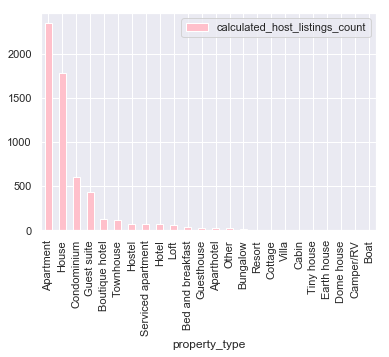

,calculated_host_listings_count
property_type,
Apartment,2343
House,1779
Condominium,607
Guest suite,430
Boutique hotel,131
Townhouse,115
Hostel,74
Serviced apartment,71
Hotel,68


In [71]:
pivot = listings.pivot_table(index= "property_type", values="calculated_host_listings_count", aggfunc='count')
pivot = pivot.sort_values("calculated_host_listings_count",ascending=False)
pivot.plot(kind='bar', color='pink')
plt.show()
pivot

10


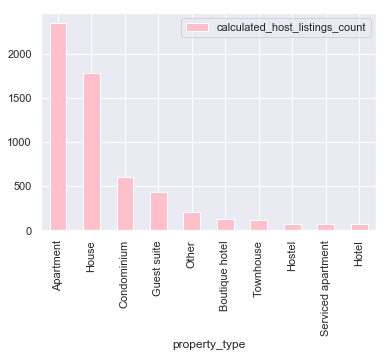

,calculated_host_listings_count
property_type,
Apartment,2343
House,1779
Condominium,607
Guest suite,430
Other,211
Boutique hotel,131
Townhouse,115
Hostel,74
Serviced apartment,71


In [72]:
series1 = pd.value_counts(listings.property_type)
mask1 = (series1/series1.sum() * 100).lt(1)
listings['property_type'] = np.where(listings['property_type'].isin(series1[mask1].index),'Other',listings['property_type'])
print(listings['property_type'].nunique())
pivot1 = listings.pivot_table(index= "property_type", values="calculated_host_listings_count", aggfunc='count')
pivot1 = pivot1.sort_values("calculated_host_listings_count",ascending=False)
pivot1.plot(kind='bar', color='pink')
plt.show()
pivot1

In [73]:
property_type = pd.get_dummies(listings["property_type"],columns = "property_type", prefix = "property_type")
listings = pd.concat([listings, property_type], axis=1)
listings.drop(['property_type'],axis=1,inplace= True)
listings

,host_response_rate,host_is_superhost,host_identity_verified,is_location_exact,room_type,accommodates,bathrooms,bedrooms,beds,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,cancellation_policy,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,host_response_time_a few days or more,host_response_time_within a day,host_response_time_within a few hours,host_response_time_within an hour,neighbourhood_Bayview,neighbourhood_Bernal Heights,neighbourhood_Castro/Upper Market,neighbourhood_Chinatown,neighbourhood_Downtown/Civic Center,neighbourhood_Excelsior,neighbourhood_Financial District,neighbourhood_Haight Ashbury,neighbourhood_Inner Richmond,neighbourhood_Inner Sunset,neighbourhood_Marina,neighbourhood_Mission,neighbourhood_Nob Hill,neighbourhood_Noe Valley,neighbourhood_North Beach,neighbourhood_Ocean View,neighbourhood_Other,neighbourhood_Outer Mission,neighbourhood_Outer Richmond,neighbourhood_Outer Sunset,neighbourhood_Pacific Heights,neighbourhood_Parkside,neighbourhood_Potrero Hill,neighbourhood_Russian Hill,neighbourhood_South of Market,neighbourhood_Visitacion Valley,neighbourhood_West of Twin Peaks,neighbourhood_Western Addition,property_type_Apartment,property_type_Boutique hotel,property_type_Condominium,property_type_Guest suite,property_type_Hostel,property_type_Hotel,property_type_House,property_type_Other,property_type_Serviced apartment,property_type_Townhouse
0,90.0,1,t,1,Entire home/apt,3,1.0,1.0,2.0,170.0,100.0,100.0,2,25.0,1,30,199,97.000000,10.000000,10.0000,10.000000,10.000000,10.000000,9.000000,moderate,1,1,0,0,1.63,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0
1,100.0,1,t,1,Private room,2,1.0,1.0,1.0,99.0,0.0,10.0,2,20.0,1,5,136,94.000000,9.000000,9.0000,10.000000,10.000000,9.000000,9.000000,strict_14_with_grace_period,3,0,3,0,1.11,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2,67.0,0,t,1,Entire home/apt,5,1.0,2.0,3.0,235.0,0.0,100.0,2,0.0,30,60,111,98.000000,10.000000,10.0000,10.000000,10.000000,10.000000,9.000000,strict_14_with_grace_period,1,1,0,0,0.89,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,100.0,1,t,1,Private room,2,4.0,1.0,1.0,65.0,200.0,50.0,1,12.0,32,60,17,85.000000,8.000000,8.0000,9.000000,9.000000,9.000000,8.000000,strict_14_with_grace_period,9,0,9,0,0.14,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
4,100.0,1,t,1,Private room,2,4.0,1.0,1.0,65.0,200.0,50.0,1,12.0,32,90,8,93.000000,9.000000,9.0000,10.000000,10.000000,9.000000,9.000000,strict_14_with_grace_period,9,0,9,0,0.13,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
5,100.0,0,t,1,Entire home/apt,4,1.5,2.0,2.0,475.0,0.0,225.0,2,150.0,4,1125,28,97.000000,10.000000,10.0000,10.000000,10.000000,10.000000,10.000000,moderate,2,2,0,0,0.23,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
6,100.0,0,f,1,Entire home/apt,6,1.0,2.0,3.0,255.0,0.0,125.0,1,0.0,2,365,36,91.000000,10.000000,8.0000,10.000000,10.000000,10.000000,9.000000,moderate,1,1,0,0,0.30,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0
7,100.0,1,f,1,Private room,3,1.0,1.0,2.0,139.0,0.0,50.0,2,60.0,1,14,687,98.000000,10.000000,10.0000,10.000000,10.000000,10.000000,10.000000,strict_14_with_grace_period,2,0,2,0,5.63,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
8,100.0,1,t,1,Private room,2,1.0,1.0,1.0,135.0,0.0,50.0,1,0.0,1,365,492,94.000000,10.000000,10.0000,10.000000,10.000000,10.000000,9.000000,strict_14_with_grace_period,1,0,1,0,4.13,0,0,

In [74]:
listings["room_type"].unique()

array(['Entire home/apt', 'Private room', 'Shared room'], dtype=object)

In [75]:
room_type = pd.get_dummies(listings["room_type"],columns = "room_type", prefix = "room_type")
listings = pd.concat([listings, room_type], axis=1)
listings.drop(['room_type'],axis=1,inplace= True)
listings

,host_response_rate,host_is_superhost,host_identity_verified,is_location_exact,accommodates,bathrooms,bedrooms,beds,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,cancellation_policy,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,host_response_time_a few days or more,host_response_time_within a day,host_response_time_within a few hours,host_response_time_within an hour,neighbourhood_Bayview,neighbourhood_Bernal Heights,neighbourhood_Castro/Upper Market,neighbourhood_Chinatown,neighbourhood_Downtown/Civic Center,neighbourhood_Excelsior,neighbourhood_Financial District,neighbourhood_Haight Ashbury,neighbourhood_Inner Richmond,neighbourhood_Inner Sunset,neighbourhood_Marina,neighbourhood_Mission,neighbourhood_Nob Hill,neighbourhood_Noe Valley,neighbourhood_North Beach,neighbourhood_Ocean View,neighbourhood_Other,neighbourhood_Outer Mission,neighbourhood_Outer Richmond,neighbourhood_Outer Sunset,neighbourhood_Pacific Heights,neighbourhood_Parkside,neighbourhood_Potrero Hill,neighbourhood_Russian Hill,neighbourhood_South of Market,neighbourhood_Visitacion Valley,neighbourhood_West of Twin Peaks,neighbourhood_Western Addition,property_type_Apartment,property_type_Boutique hotel,property_type_Condominium,property_type_Guest suite,property_type_Hostel,property_type_Hotel,property_type_House,property_type_Other,property_type_Serviced apartment,property_type_Townhouse,room_type_Entire home/apt,room_type_Private room,room_type_Shared room
0,90.0,1,t,1,3,1.0,1.0,2.0,170.0,100.0,100.0,2,25.0,1,30,199,97.000000,10.000000,10.0000,10.000000,10.000000,10.000000,9.000000,moderate,1,1,0,0,1.63,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0
1,100.0,1,t,1,2,1.0,1.0,1.0,99.0,0.0,10.0,2,20.0,1,5,136,94.000000,9.000000,9.0000,10.000000,10.000000,9.000000,9.000000,strict_14_with_grace_period,3,0,3,0,1.11,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
2,67.0,0,t,1,5,1.0,2.0,3.0,235.0,0.0,100.0,2,0.0,30,60,111,98.000000,10.000000,10.0000,10.000000,10.000000,10.000000,9.000000,strict_14_with_grace_period,1,1,0,0,0.89,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
3,100.0,1,t,1,2,4.0,1.0,1.0,65.0,200.0,50.0,1,12.0,32,60,17,85.000000,8.000000,8.0000,9.000000,9.000000,9.000000,8.000000,strict_14_with_grace_period,9,0,9,0,0.14,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
4,100.0,1,t,1,2,4.0,1.0,1.0,65.0,200.0,50.0,1,12.0,32,90,8,93.000000,9.000000,9.0000,10.000000,10.000000,9.000000,9.000000,strict_14_with_grace_period,9,0,9,0,0.13,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
5,100.0,0,t,1,4,1.5,2.0,2.0,475.0,0.0,225.0,2,150.0,4,1125,28,97.000000,10.000000,10.0000,10.000000,10.000000,10.000000,10.000000,moderate,2,2,0,0,0.23,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0
6,100.0,0,f,1,6,1.0,2.0,3.0,255.0,0.0,125.0,1,0.0,2,365,36,91.000000,10.000000,8.0000,10.000000,10.000000,10.000000,9.000000,moderate,1,1,0,0,0.30,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0
7,100.0,1,f,1,3,1.0,1.0,2.0,139.0,0.0,50.0,2,60.0,1,14,687,98.000000,10.000000,10.0000,10.000000,10.000000,10.000000,10.000000,strict_14_with_grace_period,2,0,2,0,5.63,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
8,100.0,1,t,1,2,1.0,1.0,1.0,135.0,0.0,50.0,1,0.0,1,365,492,94.000000,10.000000,10.0000,10.000000,10.000000,10.000000,9.000000,strict_14_with_grace_period,1,0,1,0,4.13,0,0,0,1,0,0,0,0,0,0,0,0,

In [76]:
listings["cancellation_policy"].unique()


array(['moderate', 'strict_14_with_grace_period', 'flexible',
       'super_strict_30', 'strict', 'super_strict_60'], dtype=object)

In [77]:
pivot4 = listings.pivot_table(index= "cancellation_policy", values="calculated_host_listings_count", aggfunc='count')
pivot4 = pivot4.sort_values("calculated_host_listings_count",ascending=False)
pivot4


,calculated_host_listings_count
cancellation_policy,
strict_14_with_grace_period,2475
moderate,2073
flexible,1175
strict,73
super_strict_30,23
super_strict_60,10


In [78]:
listings["cancellation_policy"] = listings["cancellation_policy"].map({'strict_14_with_grace_period' : 'strict_with_grace_period', 'super_strict_30' : 'super_strict', 'moderate': 'moderate','flexible': 'flexible','super_strict_60':'super_strict','strict' : 'strict'})



In [79]:
pivot4 = listings.pivot_table(index= "cancellation_policy", values="calculated_host_listings_count", aggfunc='count')
pivot4 = pivot4.sort_values("calculated_host_listings_count",ascending=False)
pivot4

,calculated_host_listings_count
cancellation_policy,
strict_with_grace_period,2475
moderate,2073
flexible,1175
strict,73
super_strict,33


In [80]:
cancellation_policy = pd.get_dummies(listings["cancellation_policy"],columns = "cancellation_policy", prefix = "cancellation")
listings = pd.concat([listings, cancellation_policy], axis=1)
listings.drop(['cancellation_policy'],axis=1,inplace= True)
listings


,host_response_rate,host_is_superhost,host_identity_verified,is_location_exact,accommodates,bathrooms,bedrooms,beds,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,host_response_time_a few days or more,host_response_time_within a day,host_response_time_within a few hours,host_response_time_within an hour,neighbourhood_Bayview,neighbourhood_Bernal Heights,neighbourhood_Castro/Upper Market,neighbourhood_Chinatown,neighbourhood_Downtown/Civic Center,neighbourhood_Excelsior,neighbourhood_Financial District,neighbourhood_Haight Ashbury,neighbourhood_Inner Richmond,neighbourhood_Inner Sunset,neighbourhood_Marina,neighbourhood_Mission,neighbourhood_Nob Hill,neighbourhood_Noe Valley,neighbourhood_North Beach,neighbourhood_Ocean View,neighbourhood_Other,neighbourhood_Outer Mission,neighbourhood_Outer Richmond,neighbourhood_Outer Sunset,neighbourhood_Pacific Heights,neighbourhood_Parkside,neighbourhood_Potrero Hill,neighbourhood_Russian Hill,neighbourhood_South of Market,neighbourhood_Visitacion Valley,neighbourhood_West of Twin Peaks,neighbourhood_Western Addition,property_type_Apartment,property_type_Boutique hotel,property_type_Condominium,property_type_Guest suite,property_type_Hostel,property_type_Hotel,property_type_House,property_type_Other,property_type_Serviced apartment,property_type_Townhouse,room_type_Entire home/apt,room_type_Private room,room_type_Shared room,cancellation_flexible,cancellation_moderate,cancellation_strict,cancellation_strict_with_grace_period,cancellation_super_strict
0,90.0,1,t,1,3,1.0,1.0,2.0,170.0,100.0,100.0,2,25.0,1,30,199,97.000000,10.000000,10.0000,10.000000,10.000000,10.000000,9.000000,1,1,0,0,1.63,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
1,100.0,1,t,1,2,1.0,1.0,1.0,99.0,0.0,10.0,2,20.0,1,5,136,94.000000,9.000000,9.0000,10.000000,10.000000,9.000000,9.000000,3,0,3,0,1.11,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0
2,67.0,0,t,1,5,1.0,2.0,3.0,235.0,0.0,100.0,2,0.0,30,60,111,98.000000,10.000000,10.0000,10.000000,10.000000,10.000000,9.000000,1,1,0,0,0.89,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
3,100.0,1,t,1,2,4.0,1.0,1.0,65.0,200.0,50.0,1,12.0,32,60,17,85.000000,8.000000,8.0000,9.000000,9.000000,9.000000,8.000000,9,0,9,0,0.14,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
4,100.0,1,t,1,2,4.0,1.0,1.0,65.0,200.0,50.0,1,12.0,32,90,8,93.000000,9.000000,9.0000,10.000000,10.000000,9.000000,9.000000,9,0,9,0,0.13,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
5,100.0,0,t,1,4,1.5,2.0,2.0,475.0,0.0,225.0,2,150.0,4,1125,28,97.000000,10.000000,10.0000,10.000000,10.000000,10.000000,10.000000,2,2,0,0,0.23,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0
6,100.0,0,f,1,6,1.0,2.0,3.0,255.0,0.0,125.0,1,0.0,2,365,36,91.000000,10.000000,8.0000,10.000000,10.000000,10.000000,9.000000,1,1,0,0,0.30,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
7,100.0,1,f,1,3,1.0,1.0,2.0,139.0,0.0,50.0,2,60.0,1,14,687,98.000000,10.000000,10.0000,10.000000,10.000000,10.000000,10.000000,2,0,2,0,5.63,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
8,100.0,1,t,1,2,1.0,1.0,1.0,135.0,0.0,50.0,1,0.0,1,365,492,94.000000,10.000000,10.0000,10.000000,10.000000,10.000000,9.000000,1,0,1,0,4.13,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0

In [81]:
listings.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 5829 entries, 0 to 7832
Data columns (total 78 columns):
host_response_rate                              5829 non-null float64
host_is_superhost                               5829 non-null int32
host_identity_verified                          5829 non-null object
is_location_exact                               5829 non-null int32
accommodates                                    5829 non-null int64
bathrooms                                       5829 non-null float64
bedrooms                                        5829 non-null float64
beds                                            5829 non-null float64
price                                           5829 non-null float64
security_deposit                                5829 non-null float64
cleaning_fee                                    5829 non-null float64
guests_included                                 5829 non-null int64
extra_people                                    5829 non-null 

5357
239
58
61
114
5829


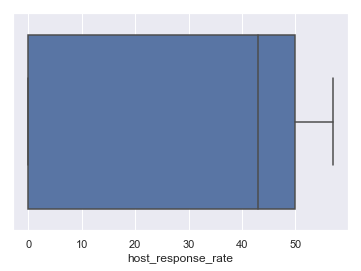

,price
host_response_rate,
10.0,475.000000
56.0,314.000000
40.0,280.666667
55.0,244.000000
33.0,200.000000
44.0,200.000000
0.0,197.162162
43.0,174.500000
50.0,164.968750


In [82]:
df1count = listings[(listings["host_response_rate"] >= 90) &(listings["host_response_rate"]<=100)].count()
#listings["host_response_rate"] = listings["host_response_rate"].astype(object)
df1 = listings[(listings["host_response_rate"] >= 90) &(listings["host_response_rate"]<=100)]
c1 = df1["host_response_rate"].count()
print(c1)
df2 = listings[(listings["host_response_rate"] < 90) & (listings["host_response_rate"]>=80)]
c2 = df2.host_response_rate.count()
print(c2)
df3 = listings[(listings["host_response_rate"] < 80) & (listings["host_response_rate"]>=70)]
c3 = df3.host_response_rate.count()
print(c3)
df4 = listings[(listings["host_response_rate"] < 70) & (listings["host_response_rate"]>=60)]
c4 = df4.host_response_rate.count()
print(c4)
df5 = listings[(listings["host_response_rate"] < 60)]
c5 = df5.host_response_rate.count()
print(c5)
print(c1+c2+c3+c4+c5)
pivot5 = df5.pivot_table(index= "host_response_rate", values="price", aggfunc='mean')
pivot5 = pivot5.sort_values("price",ascending=False)

sns.boxplot(df5["host_response_rate"])
plt.show()
pivot5

In [83]:
listings["host_response_rate"] = np.where(((listings['host_response_rate'] >=90) & (listings['host_response_rate'] <=100)), 95, listings['host_response_rate'])
listings["host_response_rate"] = np.where(((listings['host_response_rate'] >=80) & (listings['host_response_rate'] <90)), 85, listings['host_response_rate'])
listings["host_response_rate"] = np.where(((listings['host_response_rate'] >=70) & (listings['host_response_rate'] <80)), 75, listings['host_response_rate'])
listings["host_response_rate"] = np.where(((listings['host_response_rate'] >=60) & (listings['host_response_rate'] <70)), 65, listings['host_response_rate'])
listings["host_response_rate"] = np.where((listings['host_response_rate'] <60), 50, listings['host_response_rate'])
listings["host_response_rate"] = listings["host_response_rate"].astype(object)
listings["host_response_rate"] = listings["host_response_rate"].map({ 95.0 : '90-100',85.0 : '80-90', 75.0 : '70-80',65.0: '60-70',50.0:'<60'})
                                                                                                                                                        
    

In [84]:
host_response_rate = pd.get_dummies(listings["host_response_rate"],columns = "host_response_rate", prefix = "host_response_rate")
listings = pd.concat([listings, host_response_rate], axis=1)
listings.drop(['host_response_rate'],axis=1,inplace= True)
listings

,host_is_superhost,host_identity_verified,is_location_exact,accommodates,bathrooms,bedrooms,beds,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,host_response_time_a few days or more,host_response_time_within a day,host_response_time_within a few hours,host_response_time_within an hour,neighbourhood_Bayview,neighbourhood_Bernal Heights,neighbourhood_Castro/Upper Market,neighbourhood_Chinatown,neighbourhood_Downtown/Civic Center,neighbourhood_Excelsior,neighbourhood_Financial District,neighbourhood_Haight Ashbury,neighbourhood_Inner Richmond,neighbourhood_Inner Sunset,neighbourhood_Marina,neighbourhood_Mission,neighbourhood_Nob Hill,neighbourhood_Noe Valley,neighbourhood_North Beach,neighbourhood_Ocean View,neighbourhood_Other,neighbourhood_Outer Mission,neighbourhood_Outer Richmond,neighbourhood_Outer Sunset,neighbourhood_Pacific Heights,neighbourhood_Parkside,neighbourhood_Potrero Hill,neighbourhood_Russian Hill,neighbourhood_South of Market,neighbourhood_Visitacion Valley,neighbourhood_West of Twin Peaks,neighbourhood_Western Addition,property_type_Apartment,property_type_Boutique hotel,property_type_Condominium,property_type_Guest suite,property_type_Hostel,property_type_Hotel,property_type_House,property_type_Other,property_type_Serviced apartment,property_type_Townhouse,room_type_Entire home/apt,room_type_Private room,room_type_Shared room,cancellation_flexible,cancellation_moderate,cancellation_strict,cancellation_strict_with_grace_period,cancellation_super_strict,host_response_rate_60-70,host_response_rate_70-80,host_response_rate_80-90,host_response_rate_90-100,host_response_rate_<60
0,1,t,1,3,1.0,1.0,2.0,170.0,100.0,100.0,2,25.0,1,30,199,97.000000,10.000000,10.0000,10.000000,10.000000,10.000000,9.000000,1,1,0,0,1.63,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0
1,1,t,1,2,1.0,1.0,1.0,99.0,0.0,10.0,2,20.0,1,5,136,94.000000,9.000000,9.0000,10.000000,10.000000,9.000000,9.000000,3,0,3,0,1.11,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0
2,0,t,1,5,1.0,2.0,3.0,235.0,0.0,100.0,2,0.0,30,60,111,98.000000,10.000000,10.0000,10.000000,10.000000,10.000000,9.000000,1,1,0,0,0.89,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0
3,1,t,1,2,4.0,1.0,1.0,65.0,200.0,50.0,1,12.0,32,60,17,85.000000,8.000000,8.0000,9.000000,9.000000,9.000000,8.000000,9,0,9,0,0.14,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0
4,1,t,1,2,4.0,1.0,1.0,65.0,200.0,50.0,1,12.0,32,90,8,93.000000,9.000000,9.0000,10.000000,10.000000,9.000000,9.000000,9,0,9,0,0.13,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0
5,0,t,1,4,1.5,2.0,2.0,475.0,0.0,225.0,2,150.0,4,1125,28,97.000000,10.000000,10.0000,10.000000,10.000000,10.000000,10.000000,2,2,0,0,0.23,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0
6,0,f,1,6,1.0,2.0,3.0,255.0,0.0,125.0,1,0.0,2,365,36,91.000000,10.000000,8.0000,10.000000,10.000000,10.000000,9.000000,1,1,0,0,0.30,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0
7,1,f,1,3,1.0,1.0,2.0,139.0,0.0,50.0,2,60.0,1,14,687,98.000000,10.000000,10.0000,10.000000,10.000000,10.000000,10.000000,2,0,2,0,5.63,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0
8,1,t,1,2,1.0,1.0,1.0,135.0,0.0

5829


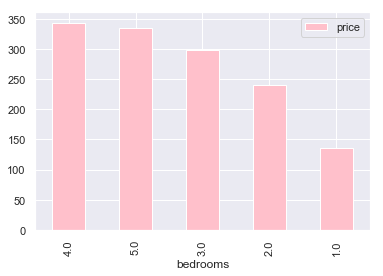

,price
bedrooms,
4.0,343.709677
5.0,335.333333
3.0,298.287640
2.0,240.757682
1.0,135.579710


In [85]:
listings = listings[listings["bedrooms"] <= 5]

print(listings.bedrooms.count())
pivot5 = listings.pivot_table(index= "bedrooms", values="price", aggfunc='mean')
pivot5 = pivot5.sort_values("price",ascending=False)
pivot5.plot(kind='bar', color='pink')
plt.show()
pivot5

In [86]:
bedrooms = pd.get_dummies(listings["bedrooms"],columns = "bedrooms", prefix = "bedrooms")
listings = pd.concat([listings, bedrooms], axis=1)
listings.drop(['bedrooms'],axis=1,inplace= True)
listings



,host_is_superhost,host_identity_verified,is_location_exact,accommodates,bathrooms,beds,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,host_response_time_a few days or more,host_response_time_within a day,host_response_time_within a few hours,host_response_time_within an hour,neighbourhood_Bayview,neighbourhood_Bernal Heights,neighbourhood_Castro/Upper Market,neighbourhood_Chinatown,neighbourhood_Downtown/Civic Center,neighbourhood_Excelsior,neighbourhood_Financial District,neighbourhood_Haight Ashbury,neighbourhood_Inner Richmond,neighbourhood_Inner Sunset,neighbourhood_Marina,neighbourhood_Mission,neighbourhood_Nob Hill,neighbourhood_Noe Valley,neighbourhood_North Beach,neighbourhood_Ocean View,neighbourhood_Other,neighbourhood_Outer Mission,neighbourhood_Outer Richmond,neighbourhood_Outer Sunset,neighbourhood_Pacific Heights,neighbourhood_Parkside,neighbourhood_Potrero Hill,neighbourhood_Russian Hill,neighbourhood_South of Market,neighbourhood_Visitacion Valley,neighbourhood_West of Twin Peaks,neighbourhood_Western Addition,property_type_Apartment,property_type_Boutique hotel,property_type_Condominium,property_type_Guest suite,property_type_Hostel,property_type_Hotel,property_type_House,property_type_Other,property_type_Serviced apartment,property_type_Townhouse,room_type_Entire home/apt,room_type_Private room,room_type_Shared room,cancellation_flexible,cancellation_moderate,cancellation_strict,cancellation_strict_with_grace_period,cancellation_super_strict,host_response_rate_60-70,host_response_rate_70-80,host_response_rate_80-90,host_response_rate_90-100,host_response_rate_<60,bedrooms_1.0,bedrooms_2.0,bedrooms_3.0,bedrooms_4.0,bedrooms_5.0
0,1,t,1,3,1.0,2.0,170.0,100.0,100.0,2,25.0,1,30,199,97.000000,10.000000,10.0000,10.000000,10.000000,10.000000,9.000000,1,1,0,0,1.63,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0
1,1,t,1,2,1.0,1.0,99.0,0.0,10.0,2,20.0,1,5,136,94.000000,9.000000,9.0000,10.000000,10.000000,9.000000,9.000000,3,0,3,0,1.11,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0
2,0,t,1,5,1.0,3.0,235.0,0.0,100.0,2,0.0,30,60,111,98.000000,10.000000,10.0000,10.000000,10.000000,10.000000,9.000000,1,1,0,0,0.89,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0
3,1,t,1,2,4.0,1.0,65.0,200.0,50.0,1,12.0,32,60,17,85.000000,8.000000,8.0000,9.000000,9.000000,9.000000,8.000000,9,0,9,0,0.14,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0
4,1,t,1,2,4.0,1.0,65.0,200.0,50.0,1,12.0,32,90,8,93.000000,9.000000,9.0000,10.000000,10.000000,9.000000,9.000000,9,0,9,0,0.13,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0
5,0,t,1,4,1.5,2.0,475.0,0.0,225.0,2,150.0,4,1125,28,97.000000,10.000000,10.0000,10.000000,10.000000,10.000000,10.000000,2,2,0,0,0.23,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0
6,0,f,1,6,1.0,3.0,255.0,0.0,125.0,1,0.0,2,365,36,91.000000,10.000000,8.0000,10.000000,10.000000,10.000000,9.000000,1,1,0,0,0.30,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0
7,1,f,1,3,1.0,2.0,139.0,0.0,50.0,2,60.0,1,14,687,98.000000,10.000000,10.0000,10.000000,10.000000,10.000000,10.000000,2,0,2,0,5.63,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0

5792


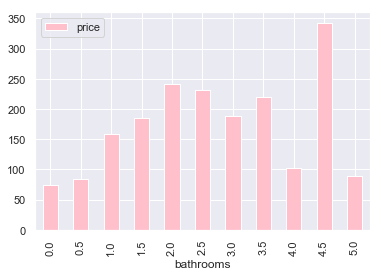

,price
bathrooms,
0.0,74.333333
0.5,84.894737
1.0,159.199314
1.5,185.179245
2.0,241.991463
2.5,231.355072
3.0,187.702128
3.5,220.516129
4.0,102.375000


In [87]:
listings = listings[listings["bathrooms"] <= 5]

print(listings.bathrooms.count())
pivot6 = listings.pivot_table(index= "bathrooms", values="price", aggfunc='mean')

pivot6.plot(kind='bar', color='pink')
plt.show()
pivot6

In [88]:
bathrooms = pd.get_dummies(listings["bathrooms"],columns = "bathrooms", prefix = "bathrooms")
listings = pd.concat([listings, bathrooms], axis=1)
listings.drop(['bathrooms'],axis=1,inplace= True)
listings

,host_is_superhost,host_identity_verified,is_location_exact,accommodates,beds,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,host_response_time_a few days or more,host_response_time_within a day,host_response_time_within a few hours,host_response_time_within an hour,neighbourhood_Bayview,neighbourhood_Bernal Heights,neighbourhood_Castro/Upper Market,neighbourhood_Chinatown,neighbourhood_Downtown/Civic Center,neighbourhood_Excelsior,neighbourhood_Financial District,neighbourhood_Haight Ashbury,neighbourhood_Inner Richmond,neighbourhood_Inner Sunset,neighbourhood_Marina,neighbourhood_Mission,neighbourhood_Nob Hill,neighbourhood_Noe Valley,neighbourhood_North Beach,neighbourhood_Ocean View,neighbourhood_Other,neighbourhood_Outer Mission,neighbourhood_Outer Richmond,neighbourhood_Outer Sunset,neighbourhood_Pacific Heights,neighbourhood_Parkside,neighbourhood_Potrero Hill,neighbourhood_Russian Hill,neighbourhood_South of Market,neighbourhood_Visitacion Valley,neighbourhood_West of Twin Peaks,neighbourhood_Western Addition,property_type_Apartment,property_type_Boutique hotel,property_type_Condominium,property_type_Guest suite,property_type_Hostel,property_type_Hotel,property_type_House,property_type_Other,property_type_Serviced apartment,property_type_Townhouse,room_type_Entire home/apt,room_type_Private room,room_type_Shared room,cancellation_flexible,cancellation_moderate,cancellation_strict,cancellation_strict_with_grace_period,cancellation_super_strict,host_response_rate_60-70,host_response_rate_70-80,host_response_rate_80-90,host_response_rate_90-100,host_response_rate_<60,bedrooms_1.0,bedrooms_2.0,bedrooms_3.0,bedrooms_4.0,bedrooms_5.0,bathrooms_0.0,bathrooms_0.5,bathrooms_1.0,bathrooms_1.5,bathrooms_2.0,bathrooms_2.5,bathrooms_3.0,bathrooms_3.5,bathrooms_4.0,bathrooms_4.5,bathrooms_5.0
0,1,t,1,3,2.0,170.0,100.0,100.0,2,25.0,1,30,199,97.000000,10.000000,10.0000,10.000000,10.000000,10.000000,9.000000,1,1,0,0,1.63,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
1,1,t,1,2,1.0,99.0,0.0,10.0,2,20.0,1,5,136,94.000000,9.000000,9.0000,10.000000,10.000000,9.000000,9.000000,3,0,3,0,1.11,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,0,t,1,5,3.0,235.0,0.0,100.0,2,0.0,30,60,111,98.000000,10.000000,10.0000,10.000000,10.000000,10.000000,9.000000,1,1,0,0,0.89,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,1,t,1,2,1.0,65.0,200.0,50.0,1,12.0,32,60,17,85.000000,8.000000,8.0000,9.000000,9.000000,9.000000,8.000000,9,0,9,0,0.14,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,1,t,1,2,1.0,65.0,200.0,50.0,1,12.0,32,90,8,93.000000,9.000000,9.0000,10.000000,10.000000,9.000000,9.000000,9,0,9,0,0.13,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
5,0,t,1,4,2.0,475.0,0.0,225.0,2,150.0,4,1125,28,97.000000,10.000000,10.0000,10.000000,10.000000,10.000000,10.000000,2,2,0,0,0.23,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
6,0,f,1,6,3.0,255.0,0.0,125.0,1,0.0,2,365,36,91.000000,10.000000,8.0000,10.000000,10.000000,10.000000,9.000000,1,1,0,0,0.30,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

5774


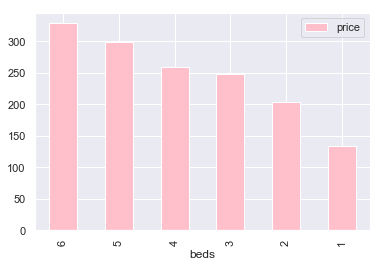

,price
beds,
6,328.896552
5,298.608696
4,259.528369
3,247.833922
2,203.577483
1,133.409105


In [89]:
listings = listings[listings["beds"] <= 6]
listings["beds"] = listings["beds"].astype(int)
print(listings.beds.count())
pivot8 = listings.pivot_table(index= "beds", values="price", aggfunc='mean')
pivot8 = pivot8.sort_values("price",ascending=False)
pivot8.plot(kind='bar', color='pink')
plt.show()
pivot8

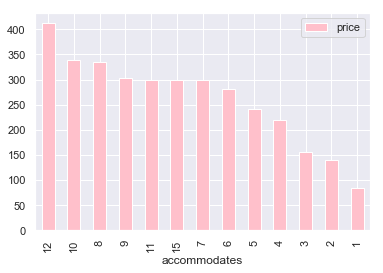

,price
accommodates,
12,412.714286
10,339.842105
8,334.318182
9,302.833333
11,300.000000
15,300.000000
7,299.794521
6,280.410891
5,241.790698


In [90]:
pivot7 = listings.pivot_table(index = "accommodates", values ="price", aggfunc ='mean')
pivot7 = pivot7.sort_values("price",ascending = False)
pivot7.plot(kind ='bar', color ='pink')
plt.show()
pivot7

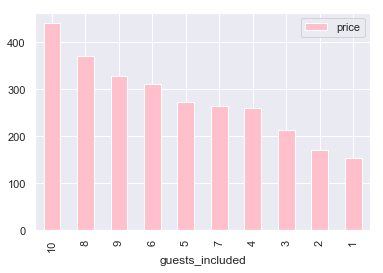

,price
guests_included,
10,441.666667
8,370.882353
9,329.000000
6,311.823009
5,272.610169
7,265.500000
4,260.479303
3,213.369427
2,170.678859


In [91]:

pivot9 = listings.pivot_table(index = "guests_included", values ="price", aggfunc ='mean')
pivot9 = pivot9.sort_values("price",ascending = False)
pivot9.plot(kind ='bar', color ='pink')
plt.show()
pivot9

In [92]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5774 entries, 0 to 7832
Data columns (total 96 columns):
host_is_superhost                               5774 non-null int32
host_identity_verified                          5774 non-null object
is_location_exact                               5774 non-null int32
accommodates                                    5774 non-null int64
beds                                            5774 non-null int32
price                                           5774 non-null float64
security_deposit                                5774 non-null float64
cleaning_fee                                    5774 non-null float64
guests_included                                 5774 non-null int64
extra_people                                    5774 non-null float64
minimum_nights                                  5774 non-null int64
maximum_nights                                  5774 non-null int64
number_of_reviews                               5774 non-null int64


# FEATURE SCALING

In [93]:
listings.drop(columns = ["host_identity_verified"],inplace = True)

y = listings["price"]
X = listings.drop(columns = ["price"])

In [94]:
X_train_org,X_test_org,y_train,y_test=train_test_split(X,y,random_state=0,test_size=0.3)

In [95]:
X_train_org.shape

(4041, 94)

In [96]:
X_test_org.shape

(1733, 94)

In [97]:

sc = StandardScaler()
X_train = sc.fit_transform(X_train_org)
X_test = sc.transform(X_test_org)

# MODELING

## LINEAR REGRESSION

In [98]:
train_score = []
test_score = []
model_Scores = []

In [99]:
from sklearn.linear_model import LinearRegression

lreg = LinearRegression()
lreg.fit(X_train, y_train)
print('Train Score:',lreg.score(X_train, y_train))
train_score.append(lreg.score(X_train, y_train))
test_score.append(lreg.score(X_test, y_test))
train_score = lreg.score(X_train, y_train)
test_score = lreg.score(X_test,y_test)
print("Test Score {:.2f}".format(test_score))
## Appending the results 
model_Scores.append({'Model Type' : 'Regression',
                    'Model Name' : 'Linear Regression',
                    'Parameters' : '-',
                    'Training_score': train_score,
                    'Test Score':test_score})


Train Score: 0.6277386146120525
Test Score 0.57


In [100]:
y_pred_lin = lreg.predict(X_test)
r2_score(y_test,y_pred_lin)

0.5746322172239109

Text(0.5, 0, 'RM')

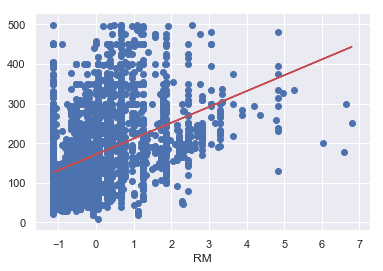

In [101]:
%matplotlib inline
import matplotlib.pyplot as plt

X_train_rm = X_train[:,5].reshape(-1,1)
lreg.fit(X_train_rm, y_train)
y_predict = lreg.predict(X_train_rm)

plt.plot(X_train_rm, y_predict, c = 'r')
plt.scatter(X_train_rm,y_train)
plt.xlabel('RM')

In [102]:
from sklearn import model_selection
kfold = model_selection.KFold(n_splits = 10, random_state = 100)
model_kfold = LinearRegression()
results_kfold = model_selection.cross_val_score(model_kfold, X, y, cv = kfold)
print("Accuracy: %.2f%%" % (results_kfold.mean()*100.0))

Accuracy: 58.00%


## POLYNOMIAL REGRESSION

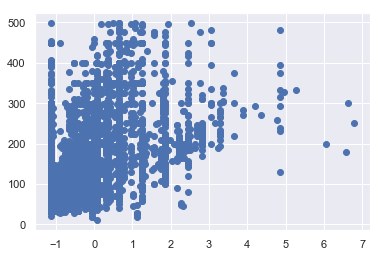

In [103]:
from  sklearn.preprocessing  import PolynomialFeatures

X_train_1 = X_train[:,5].reshape(-1,1)
plt.scatter(X_train_1,y_train)

In [104]:
train_score_list = []
test_score_list = []

for n in range(2,4):
    poly = PolynomialFeatures(n)
    X_train_poly = poly.fit_transform(X_train)
    X_test_poly = poly.transform(X_test)
    lreg.fit(X_train_poly, y_train)
    scores_train = cross_val_score(lreg, X_train_poly, y_train, cv=3)
    scores_test = lreg.score(X_test_poly,y_test)
    test_score_list.append(scores_test)
    train_score_list.append(scores_train.mean())
    
print("Train Scores", train_score_list)
print("Test Scores", test_score_list)

Train Scores [-3.5488865482143527e+19, -9.918478435232078e+18]
Test Scores [-1.137344328040649e+20, -1.365666205564552e+18]


In [105]:
print("Train Scores", train_score_list[1])
print("Test Scores", test_score_list[1])
model_Scores.append({'Model Type' : 'Regression',
                    'Model Name' : 'Polynomial Regression',
                    'Parameters' : {'Degree':2},
                    'Training_score':train_score_list[1],
                    'Test Score':test_score_list[1]})

Train Scores -9.918478435232078e+18
Test Scores -1.365666205564552e+18


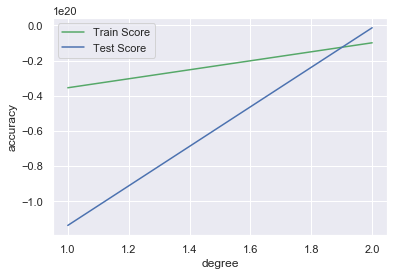

In [106]:
%matplotlib inline

x_axis = range(1,3)
plt.plot(x_axis, train_score_list, c = 'g', label = 'Train Score')
plt.plot(x_axis, test_score_list, c = 'b', label = 'Test Score')
plt.xlabel('degree')
plt.ylabel('accuracy')
plt.legend()

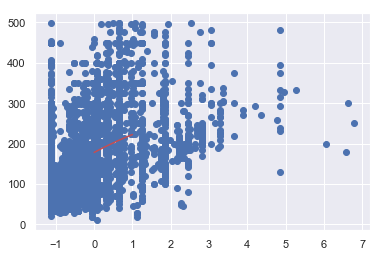

In [107]:
poly = PolynomialFeatures(n)
X_train_poly = poly.fit_transform(X_train_1)
lreg.fit(X_train_poly, y_train)

x_axis = np.linspace(0,1,100).reshape(-1,1)
x_poly = poly.transform(x_axis)
y_predict = lreg.predict(x_poly)

X_train_1 = X_train[:,5].reshape(-1,1)
plt.scatter(X_train_1,y_train)
plt.plot(x_axis, y_predict, c = 'r')

## KNN REGRESSOR

Text(0, 0.5, 'MSE')

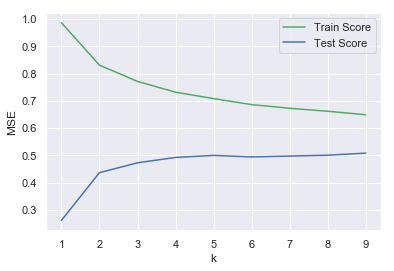

In [108]:
%matplotlib inline
train_score_array = []
test_score_array = []

for k in range(1,10):
    knn_reg = KNeighborsRegressor(k)
    knn_reg.fit(X_train, y_train)
    train_score_array.append(knn_reg.score(X_train, y_train))
    test_score_array.append(knn_reg.score(X_test, y_test))

x_axis = range(1,10)
plt.plot(x_axis, train_score_array, c = 'g', label = 'Train Score')
plt.plot(x_axis, test_score_array, c = 'b', label = 'Test Score')
plt.legend()
plt.xlabel('k')
plt.ylabel('MSE')

In [109]:
print(train_score_array)
print(test_score_array)

[0.9866769627505549, 0.831114173371621, 0.7714883635478882, 0.7318915154382359, 0.7083850723669651, 0.6863813940484661, 0.6728232957439768, 0.6619156474613307, 0.6491471631361726]
[0.26151741569745335, 0.4367007563309244, 0.47284959831773177, 0.49254423737279684, 0.5000169797987188, 0.49444284094157265, 0.49760948274636224, 0.5007786974985815, 0.5084147139095303]


In [111]:
def printGridResult (model_def) :
    print("Best CV result: {}".format(model_def.best_score_))
    print("Best parameters: {}".format(model_def.best_params_))
    print("Training Score: {}".format(model_def.score(X_train, y_train)))
    print("Testing Score: {}".format(model_def.score(X_test, y_test)))
    
#KNN Regressor
knnRegressor = KNeighborsRegressor()
noofNeighbors = {'n_neighbors':[1, 5, 10, 15, 20]}
print("Parameter grid:\n{}".format(noofNeighbors))
knnGridSCV = GridSearchCV(knnRegressor, param_grid = noofNeighbors, cv=5, return_train_score=True)
knnGridSCV.fit(X_train, y_train)

n_neighbors = [1, 5, 10, 15, 20]

n_neighbors = [1, 5, 10, 15, 20]

train_knnRegressor = knnGridSCV.cv_results_["mean_train_score"]

test_knnRegressor = knnGridSCV.cv_results_["mean_test_score"]

printGridResult(knnGridSCV)

model_Scores.append({'Model Type' : 'Regression',
                    'Model Name' : 'KNN Regressor',
                    'Parameters' : knnGridSCV.best_params_,
                    'Training_score': knnGridSCV.score(X_train, y_train),
                    'Test Score': knnGridSCV.score(X_test, y_test )})

Parameter grid:
{'n_neighbors': [1, 5, 10, 15, 20]}
Best CV result: 0.5284313086577018
Best parameters: {'n_neighbors': 10}
Training Score: 0.6393939518337186
Testing Score: 0.5103967496168658


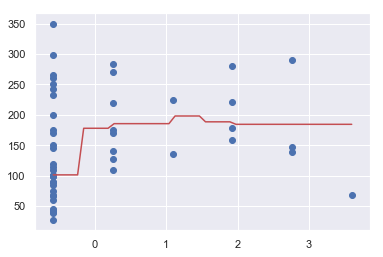

In [112]:
X_b = X_train[:50,6].reshape(-1,1)
y_b = y_train[:50]

knn_reg = KNeighborsRegressor(10)
knn_reg.fit(X_b, y_b)

X_new=np.linspace(X_b.min(), X_b.max(), 50).reshape(50, 1)
y_predict = knn_reg.predict(X_new)

plt.plot(X_new, y_predict, c = 'r')
plt.scatter(X_b, y_b)


## RIDGE REGRESSION 

In [113]:
from  sklearn.linear_model import Ridge

x_range = [0.01, 0.1, 1, 10, 100]
train_score_list = []
test_score_list = []

for alpha in x_range: 
    ridge = Ridge(alpha)
    ridge.fit(X_train,y_train)
    train_score_list.append(ridge.score(X_train,y_train))
    test_score_list.append(ridge.score(X_test, y_test))
print(train_score_list)
print(test_score_list)

[0.6278141770666759, 0.627814176831849, 0.6278141533832768, 0.6278118419880367, 0.6276089028868538]
[0.5746801892281622, 0.5746807119848855, 0.5746859153486843, 0.5747355677606556, 0.5750267353139064]


Text(0.5, 0, '$\\alpha$')

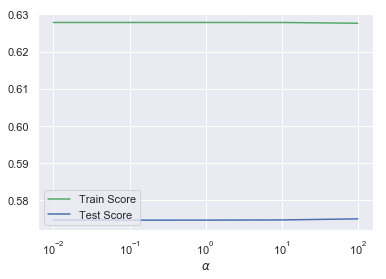

In [114]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.plot(x_range, train_score_list, c = 'g', label = 'Train Score')
plt.plot(x_range, test_score_list, c = 'b', label = 'Test Score')
plt.xscale('log')
plt.legend(loc = 3)
plt.xlabel(r'$\alpha$')

In [115]:
# Ridge Regression
ridgeParamGSV = {'alpha': [0.001, 0.01, 0.1, 1, 10, 100]}
print("Parameter grid:\n{}".format(ridgeParamGSV))

ridgeGridSV = GridSearchCV(estimator = Ridge(random_state = 0 ),param_grid = ridgeParamGSV, 
                           cv=5, return_train_score=True, scoring='r2', n_jobs=1)
ridgeGridSV.fit(X_train, y_train)

ridge_train_scores_mean = ridgeGridSV.cv_results_["mean_train_score"]
ridge_test_scores_mean = ridgeGridSV.cv_results_["mean_test_score"]

model_Scores.append({'Model Type' : 'Regression',
                    'Model Name' : 'Ridge Regression',
                    'Parameters' : ridgeGridSV.best_params_,
                    'Training_score': ridgeGridSV.score(X_train, y_train),
                    'Test Score': ridgeGridSV.score(X_test, y_test )})
printGridResult(ridgeGridSV)

Parameter grid:
{'alpha': [0.001, 0.01, 0.1, 1, 10, 100]}
Best CV result: 0.6033043158737826
Best parameters: {'alpha': 100}
Training Score: 0.6276089028868538
Testing Score: 0.5750267353139064


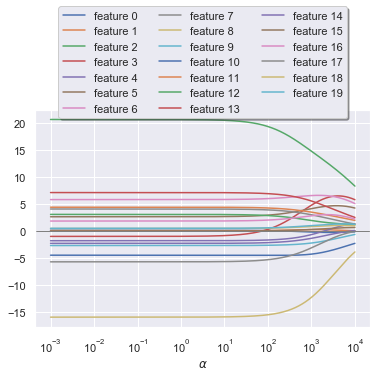

In [116]:
%matplotlib inline
import numpy as np

x_range1 = np.linspace(0.001, 1, 100).reshape(-1,1)
x_range2 = np.linspace(1, 10000, 10000).reshape(-1,1)

x_range = np.append(x_range1, x_range2)
coeff = []

for alpha in x_range: 
    ridge = Ridge(alpha)
    ridge.fit(X_train,y_train)
    coeff.append(ridge.coef_ )
    
coeff = np.array(coeff)

for i in range(0,20):
    plt.plot(x_range, coeff[:,i], label = 'feature {:d}'.format(i))

plt.axhline(y=0, xmin=0.001, xmax=9999, linewidth=1, c ='gray')
plt.xlabel(r'$\alpha$')
plt.xscale('log')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.5),
          ncol=3, fancybox=True, shadow=True)
plt.show()

In [117]:
from sklearn import model_selection
kfold = model_selection.KFold(n_splits = 10, random_state = 100)
model_kfold = Ridge(alpha = 100)
results_kfold = model_selection.cross_val_score(model_kfold, X, y, cv=kfold)
print("Accuracy: %.2f%%" %(results_kfold.mean()*100.0))

Accuracy: 56.92%


## LASSO REGRESSION

In [118]:
from sklearn.linear_model import Lasso
x_range = [0.01, 0.1, 1, 10, 100]
train_score_list = []
test_score_list = []

for alpha in x_range: 
    lasso = Lasso(alpha)
    lasso.fit(X_train,y_train)
    train_score_list.append(lasso.score(X_train,y_train))
    test_score_list.append(lasso.score(X_test, y_test))
print(train_score_list)
print(test_score_list)

[0.6278130082260489, 0.6277062421084709, 0.6196471453062028, 0.47360413399162643, 0.0]
[0.5746989247324958, 0.5747415866899004, 0.5691794137116017, 0.44042142009653773, -0.001725493328951444]


In [119]:
#Lasso Regression
lassoParamGSV = {'alpha': [0.001, 0.01, 0.1, 1, 10, 100]}
print("Parameter grid:\n{}".format(lassoParamGSV))

lassoGridSV = GridSearchCV(estimator = Lasso(random_state = 0 ),param_grid = lassoParamGSV, 
                           cv=5, return_train_score=True, scoring='r2', n_jobs=1)
lassoGridSV.fit(X_train, y_train)

lasso_train_scores_mean = lassoGridSV.cv_results_["mean_train_score"]
lasso_test_scores_mean = lassoGridSV.cv_results_["mean_test_score"]

model_Scores.append({'Model Type' : 'Regression',
                    'Model Name' : 'Lasso Regression',
                    'Parameters' : lassoGridSV.best_params_,
                    'Training_score': lassoGridSV.score(X_train, y_train),
                    'Test Score': lassoGridSV.score(X_test, y_test )})
printGridResult(lassoGridSV)

Parameter grid:
{'alpha': [0.001, 0.01, 0.1, 1, 10, 100]}
Best CV result: 0.6026840709968957
Best parameters: {'alpha': 0.1}
Training Score: 0.6277062421084709
Testing Score: 0.5747415866899004


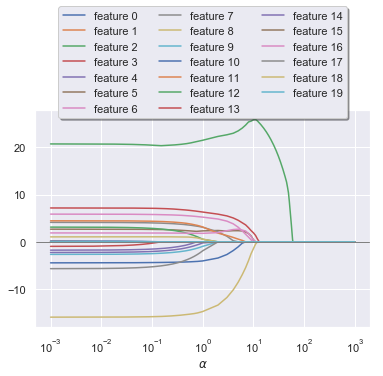

In [120]:
%matplotlib inline

x_range1 = np.linspace(0.001, 1, 1000).reshape(-1,1)
x_range2 = np.linspace(1, 1000, 1000).reshape(-1,1)

x_range = np.append(x_range1, x_range2)
coeff = []

for alpha in x_range: 
    lasso = Lasso(alpha)
    lasso.fit(X_train,y_train)
    coeff.append(lasso.coef_ )
    
coeff = np.array(coeff)

for i in range(0,20):
    plt.plot(x_range, coeff[:,i], label = 'feature {:d}'.format(i))

plt.axhline(y=0, xmin=0.001, xmax=9999, linewidth=1, c ='gray')
plt.xlabel(r'$\alpha$')
plt.xscale('log')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.5),
          ncol=3, fancybox=True, shadow=True)
plt.show()

In [121]:
from sklearn import model_selection
kfold = model_selection.KFold(n_splits = 10, random_state = 100)
model_kfold = Lasso(alpha = 0.1)
results_kfold = model_selection.cross_val_score(model_kfold, X, y, cv=kfold)
print("Accuracy: %.2f%%" %(results_kfold.mean()*100.0))

Accuracy: 58.01%


## SVM REGRESSION

In [122]:
from sklearn import svm
tuning_parameters = [{'C': [0.01, 0.1 ,1, 10, 100], 'kernel': ['linear']},
  {'C': [0.01, 0.1 ,1, 10, 100], 'gamma': [0.1,0.01, 0.001, 0.0001, 0.00001], 'kernel': ['rbf']}]

svm_grid = GridSearchCV(svm.SVR(), param_grid=tuning_parameters,cv=5)


svm_model=svm_grid.fit(X_train,y_train) 
print(svm_model.best_params_)
print('Validation score:', svm_model.best_score_) 



{'C': 100, 'gamma': 0.01, 'kernel': 'rbf'}
Validation score: 0.634296648179041


In [124]:
#SVM With Linear Kernal
from sklearn.svm import LinearSVR,SVR
linearSVM = SVR(kernel='linear')
param_Linear_SVM = { 
    'gamma': [0.001, 0.01, 0.1, 1, 10],
    'C': [0.001, 0.01, 0.1, 1, 10],
}

LinearSVMGrid = GridSearchCV(estimator=linearSVM, param_grid=param_Linear_SVM, cv=3, n_jobs=-1)
LinearSVMGrid.fit(X_train, y_train)

print('Train score:',LinearSVMGrid.score(X_train, y_train))
print('Test score:',LinearSVMGrid.score(X_test, y_test))
print('Best parameters:',LinearSVMGrid.best_params_)

model_Scores.append({'Model Type' : 'Regression',
                    'Model Name' : 'Linear SVM',
                    'Parameters' : LinearSVMGrid.best_params_,
                    'Training_score': LinearSVMGrid.score(X_train, y_train),
                    'Test Score': LinearSVMGrid.score(X_test, y_test )})

Train score: 0.608152859484705
Test score: 0.5527286103744447
Best parameters: {'C': 1, 'gamma': 0.001}


In [125]:
#SVM With Radial Kernal
svmRadial = SVR(kernel = 'rbf')
param_Radial_SVM = {'C': [0.001, 0.01, 0.1, 1, 10, 100],'gamma': [0.001, 0.01, 0.1, 1, 10, 100]}
print("Parameter grid:\n{}".format(param_Radial_SVM))
svmRadialGridSV  = GridSearchCV(svmRadial, param_grid = param_Radial_SVM, cv=5, return_train_score=True)

svmRadialGridSV.fit(X_train, y_train)

svmRadialGridSV_results = pd.DataFrame(svmRadialGridSV.cv_results_)

printGridResult(svmRadialGridSV)
model_Scores.append({'Model Type' : 'Regression',
                    'Model Name' : 'SVM Radial',
                    'Parameters' : svmRadialGridSV.best_params_,
                    'Training_score': svmRadialGridSV.score(X_train, y_train),
                    'Test Score': svmRadialGridSV.score(X_test, y_test )})

Parameter grid:
{'C': [0.001, 0.01, 0.1, 1, 10, 100], 'gamma': [0.001, 0.01, 0.1, 1, 10, 100]}
Best CV result: 0.634296648179041
Best parameters: {'C': 100, 'gamma': 0.01}
Training Score: 0.7965109389825114
Testing Score: 0.6129452123567071


In [126]:
#Polynomial SVM Kernal
polySVM = SVR(kernel = 'poly', degree = 2)
paramPolySVM = {'C': [0.001, 0.01, 0.1, 1, 10, 100]}
print("Parameter grid:\n{}".format(paramPolySVM))
polySVMGridSV = GridSearchCV(polySVM, param_grid = paramPolySVM, cv=5, return_train_score= True)

polySVMGridSV.fit(X_train, y_train)

printGridResult(polySVMGridSV)
model_Scores.append({'Model Type' : 'Regression',
                    'Model Name' : 'Polynomial SVM',
                    'Parameters' : polySVMGridSV.best_params_,
                    'Training_score': polySVMGridSV.score(X_train, y_train),
                    'Test Score': polySVMGridSV.score(X_test, y_test )})

Parameter grid:
{'C': [0.001, 0.01, 0.1, 1, 10, 100]}
Best CV result: 0.547785744088905
Best parameters: {'C': 100}
Training Score: 0.7464654145254829
Testing Score: 0.540805998063183


In [129]:
from sklearn.metrics import mean_squared_error
import xgboost as xgb
import time
from xgboost.sklearn import XGBRegressor

xgb_reg_start = time.time()

xgb_reg = xgb.XGBRegressor()
xgb_reg.fit(X_train, y_train)
training_preds_xgb_reg = xgb_reg.predict(X_train)
val_preds_xgb_reg = xgb_reg.predict(X_test)

xgb_reg_end = time.time()

print(f"Time taken to run: {round((xgb_reg_end - xgb_reg_start)/60,1)} minutes")
print("\nTraining MSE:", round(mean_squared_error(y_train, training_preds_xgb_reg),4))
print("Validation MSE:", round(mean_squared_error(y_test, val_preds_xgb_reg),4))
print("\nTraining r2:", round(r2_score(y_train, training_preds_xgb_reg),4))
model_Scores.append({'Model Type' : 'Regression',
                    'Model Name' : 'XGBRegressor',
                    'Parameters' : '-',
                    'Training_score': xgb_reg.score(X_train, y_train),
                    'Test Score': xgb_reg.score(X_test, y_test )})

[17:36:01] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Time taken to run: 0.0 minutes

Training MSE: 2695.2386
Validation MSE: 3490.6037

Training r2: 0.7172


Feature Importance using XGBRegressor Model


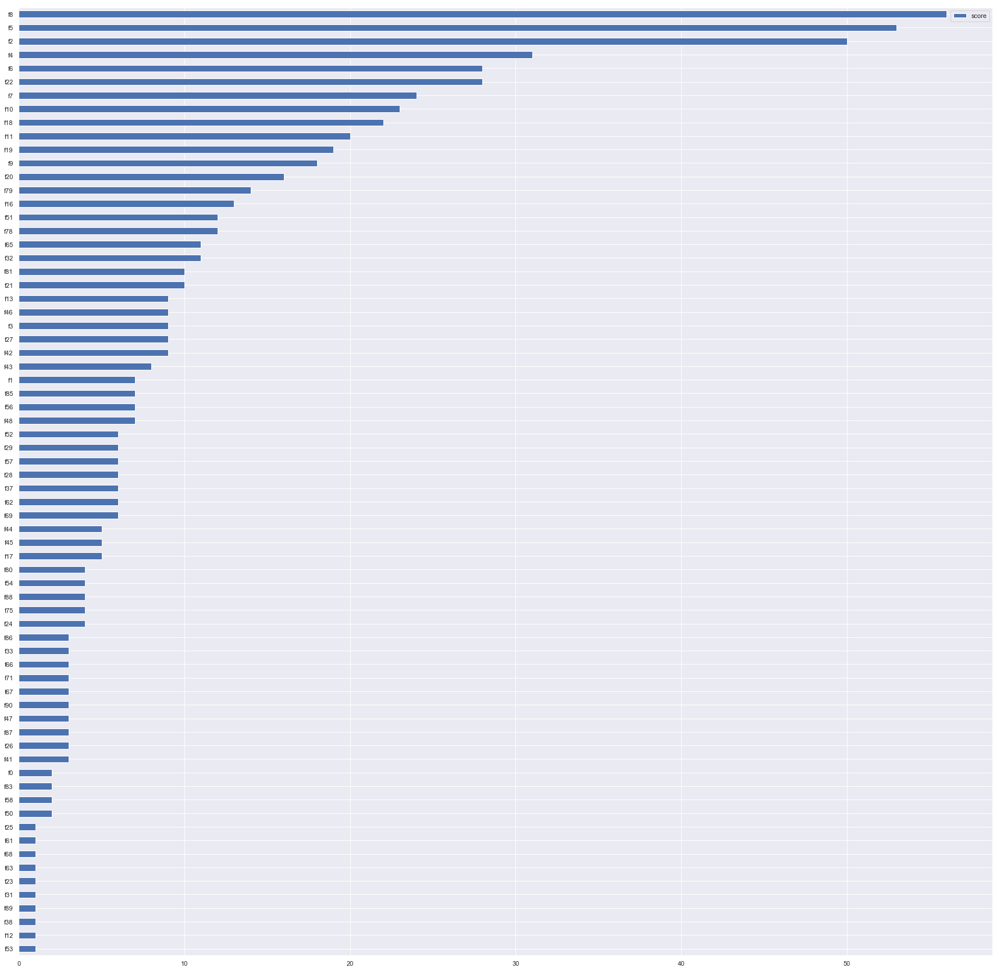

In [141]:
feature_important = xgb_reg.get_booster().get_score(importance_type='weight')
keys = list(feature_important.keys())
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=True)
print('Feature Importance using XGBRegressor Model')
data.plot(kind='barh',figsize=(30,30))

From our best Model i.e. the XGBRegressor Model; we found that the following 10 features are important to determine the price of a listing:

minimum_nights

cleaning_fee

accommodates

security_deposit

guests_included

reviews_per_month

extra_people

number_of_reviews

calculated_host_listings_count

review_scores_rating

# Model Results

In [137]:
print("Model Results:")
modelResult = pd.DataFrame(model_Scores)
# Dropped the duplicate column 'Best Parameters'as we already have Parameters displayed in the Result grid
modelResult.drop('Best Parameters', axis = 1, inplace = True)
modelResult.set_index('Model Name', inplace = True)
modelResult

Model Results:


,Model Type,Parameters,Test Score,Training_score
Model Name,,,,
Linear Regression,Regression,-,5.746322e-01,6.277386e-01
Polynomial Regression,Regression,{'Degree': 2},-1.365666e+18,-9.918478e+18
KNN Regressor,Regression,{'n_neighbors': 10},5.103967e-01,6.393940e-01
Ridge Regression,Regression,{'alpha': 100},5.750267e-01,6.276089e-01
Lasso Regression,Regression,{'alpha': 0.1},5.747416e-01,6.277062e-01
Linear SVM,Regression,"{'C': 1, 'gamma': 0.001}",5.527286e-01,6.081529e-01
SVM Radial,Regression,"{'C': 100, 'gamma': 0.01}",6.129452e-01,7.965109e-01
Polynomial SVM,Regression,{'C': 100},5.408060e-01,7.464654e-01
XGBRegressor,Regression,NaN,6.489768e-01,7.172015e-01


From the above results obtained by comparing the various ML models; XGB Regressor is the best performing model in our case
based on the Training and Test scores.